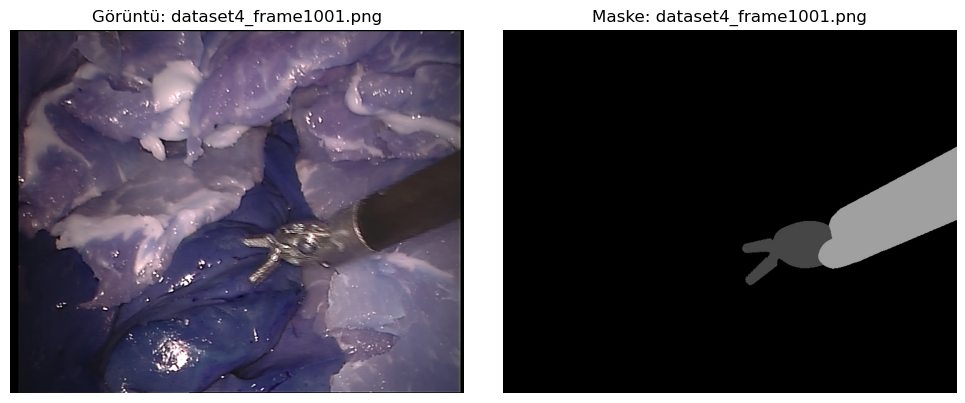

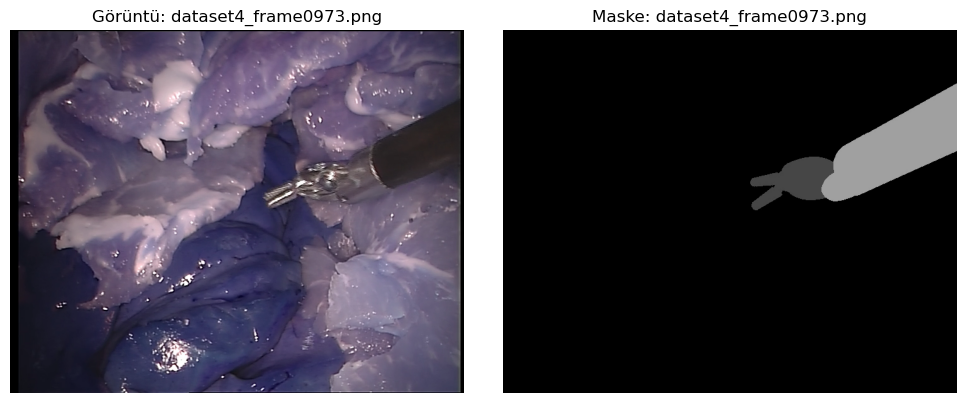

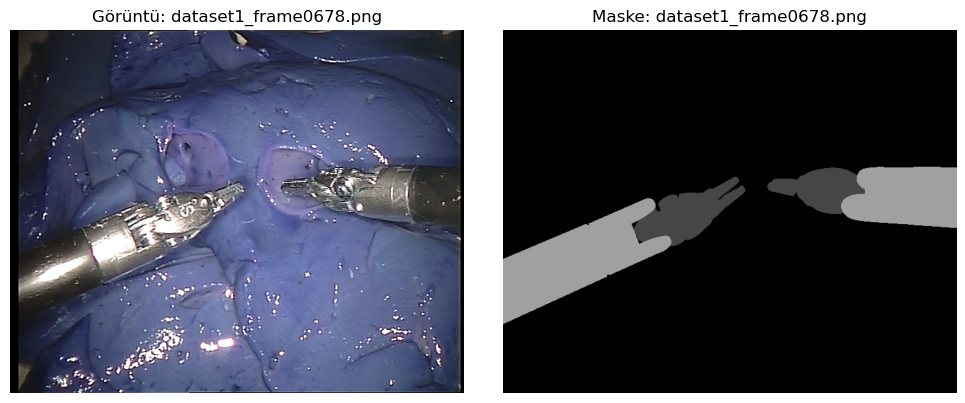

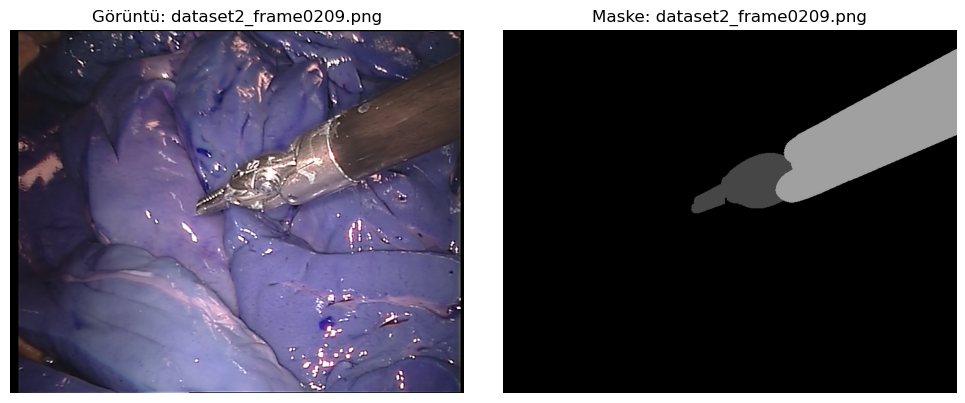

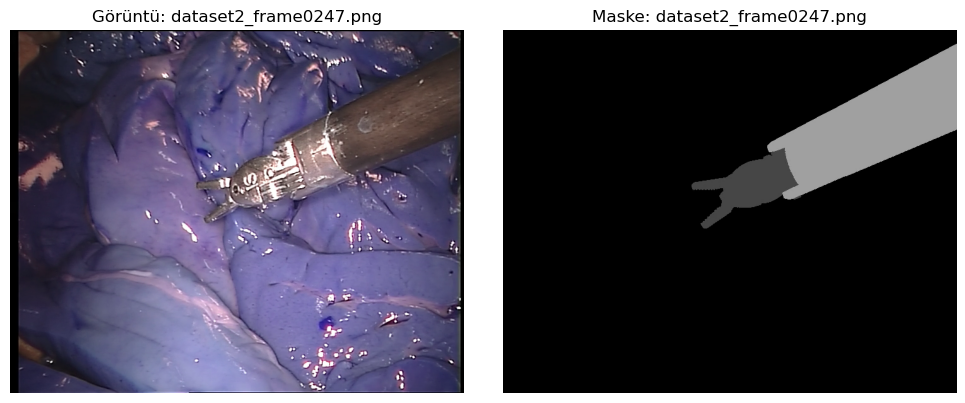

In [1]:
import random
import cv2
import matplotlib.pyplot as plt
from pathlib import Path

# 📁 Klasör yolları
img_dir = Path(r"C:/Users/EXCALIBUR/Desktop/project/data/robotic/images")
mask_dir = Path(r"C:/Users/EXCALIBUR/Desktop/project/data/robotic/masks")

# 📋 Tüm görüntü dosyalarını al
image_files = sorted(list(img_dir.glob("*.png")))
mask_files = sorted(list(mask_dir.glob("*.png")))

# 🔀 Rastgele 5 tanesini seç
samples = random.sample(image_files, 5)

# 🔁 Her biri için görselleştirme yap
for img_path in samples:
    mask_path = mask_dir / img_path.name

    # Görüntüleri oku
    img = cv2.imread(str(img_path))
    mask = cv2.imread(str(mask_path))

    # BGR → RGB dönüşümü
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)

    # Görselleştir
    plt.figure(figsize=(10, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(img)
    plt.title(f"Görüntü: {img_path.name}")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(mask)
    plt.title(f"Maske: {mask_path.name}")
    plt.axis("off")

    plt.tight_layout()
    plt.show()


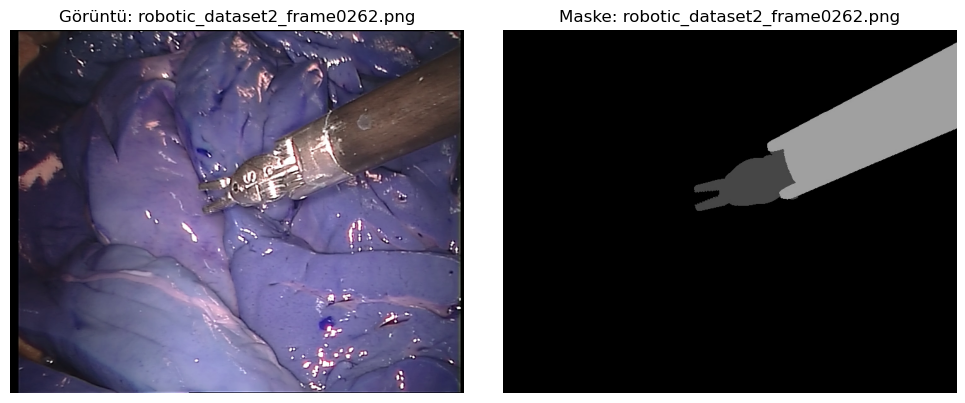

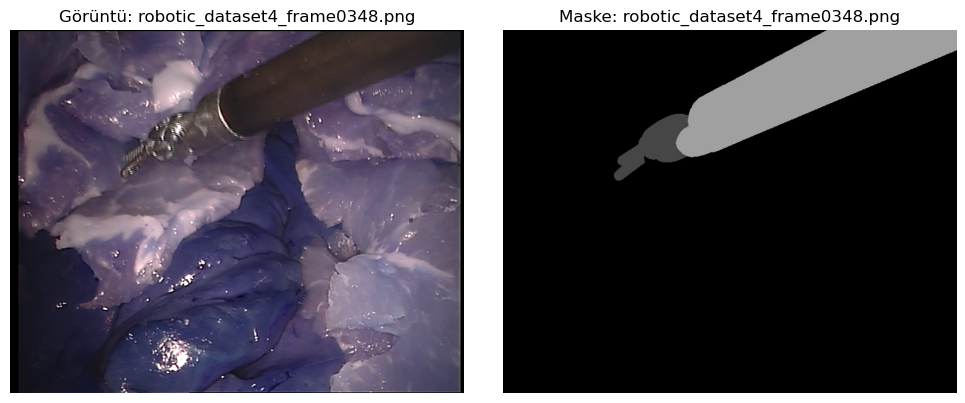

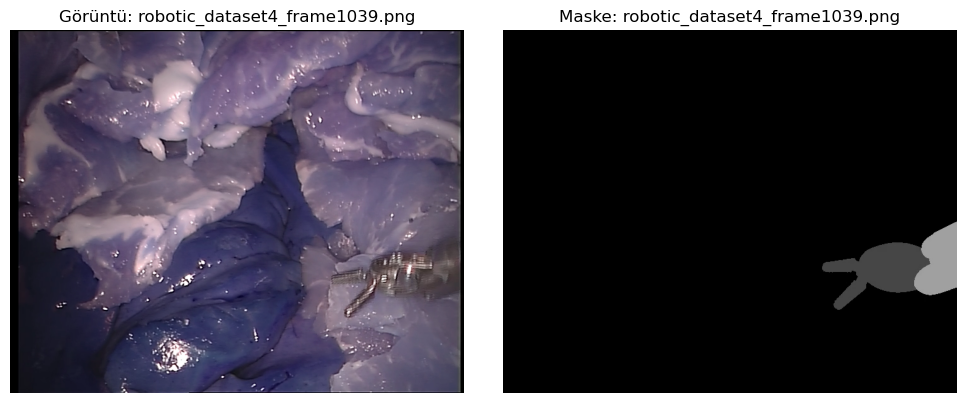

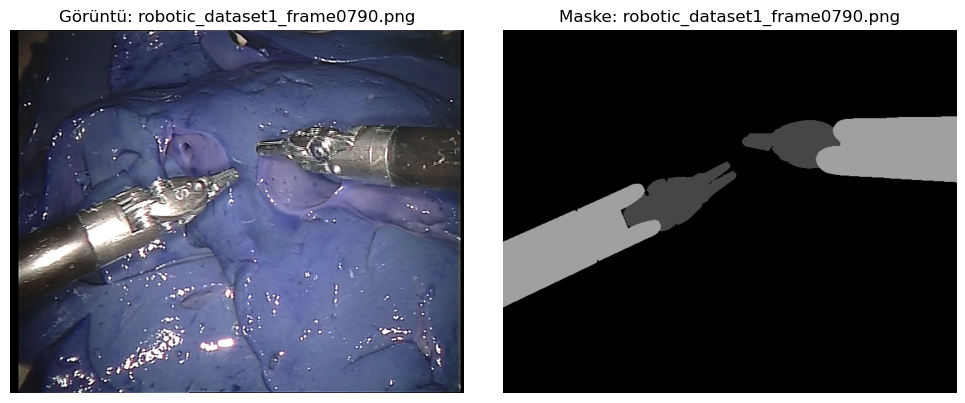

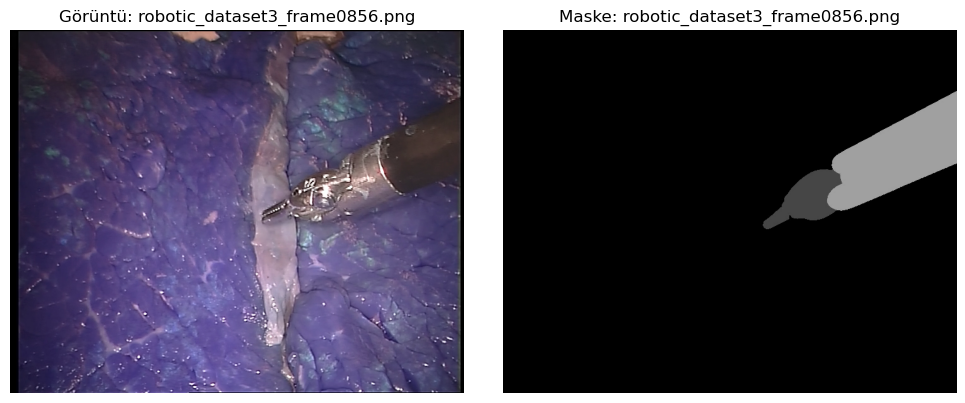

In [9]:
import random
import cv2
import matplotlib.pyplot as plt
from pathlib import Path

# 📁 Klasör yolları
img_dir = Path(r"C:/Users/EXCALIBUR/Desktop/project/data/combined/images")
mask_dir = Path(r"C:/Users/EXCALIBUR/Desktop/project/data/combined/masks")

# 📋 Tüm görüntü dosyalarını al
image_files = sorted(list(img_dir.glob("*.png")))

# 🔀 Rastgele 5 tanesini seç
samples = random.sample(image_files, 5)

# 🔁 Her biri için görselleştirme yap
for img_path in samples:
    mask_path = mask_dir / img_path.name

    # Görüntüleri oku
    img = cv2.imread(str(img_path))
    mask = cv2.imread(str(mask_path))

    # BGR → RGB dönüşümü
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)

    # Görselleştir
    plt.figure(figsize=(10, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(img)
    plt.title(f"Görüntü: {img_path.name}")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(mask)
    plt.title(f"Maske: {mask_path.name}")
    plt.axis("off")

    plt.tight_layout()
    plt.show()


In [11]:
import os
import shutil
from pathlib import Path
from sklearn.model_selection import train_test_split

# 📁 Combined klasörleri
combined_images = Path(r"C:/Users/EXCALIBUR/Desktop/project/data/combined/images")
combined_masks = Path(r"C:/Users/EXCALIBUR/Desktop/project/data/combined/masks")

# 📄 Tüm görüntü dosyalarını al (maskelerle birebir eşleşmeli)
all_images = sorted([f for f in combined_images.glob("*.png")])

# 🧪 Train / Val / Test oranları
train_imgs, temp_imgs = train_test_split(all_images, test_size=0.2, random_state=42)
val_imgs, test_imgs = train_test_split(temp_imgs, test_size=0.5, random_state=42)

# 🗂️ Yeni klasör yapısını hazırla
base_path = Path(r"C:/Users/EXCALIBUR/Desktop/project/data/combined")
splits = ['train', 'val', 'test']
for split in splits:
    (base_path / split / "images").mkdir(parents=True, exist_ok=True)
    (base_path / split / "masks").mkdir(parents=True, exist_ok=True)

# 🔁 Kopyalama fonksiyonu
def copy_files(image_list, split_name):
    for img_path in image_list:
        fname = img_path.name
        mask_path = combined_masks / fname

        target_img = base_path / split_name / "images" / fname
        target_mask = base_path / split_name / "masks" / fname

        shutil.copy(img_path, target_img)
        shutil.copy(mask_path, target_mask)

# 🚚 Her split için kopyalama yap
copy_files(train_imgs, "train")
copy_files(val_imgs, "val")
copy_files(test_imgs, "test")

print("✅ Veriler başarıyla train / val / test olarak ayrıldı ve kopyalandı.")


✅ Veriler başarıyla train / val / test olarak ayrıldı ve kopyalandı.


🔍 TRAIN setinden örnekler:


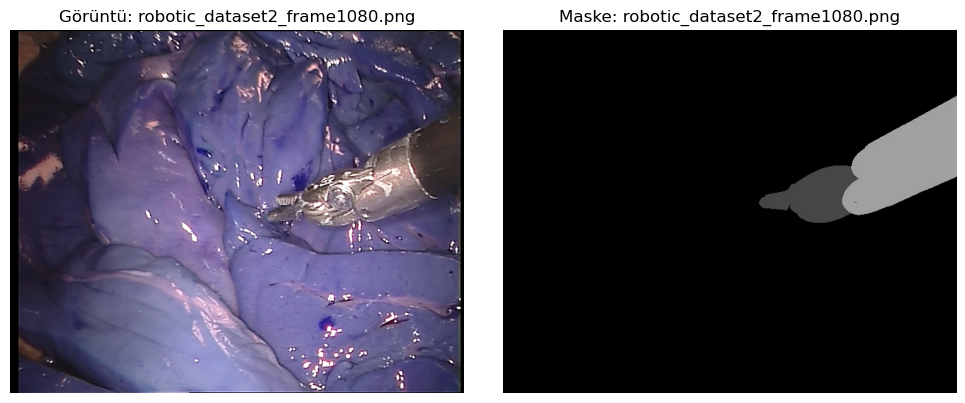

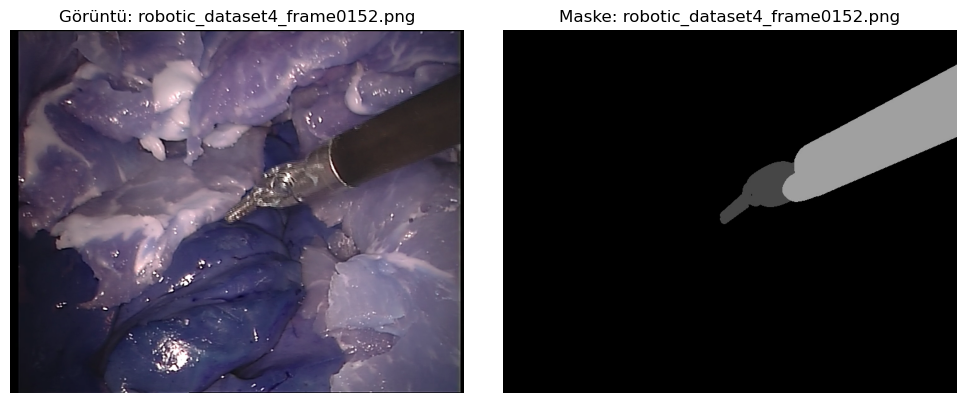

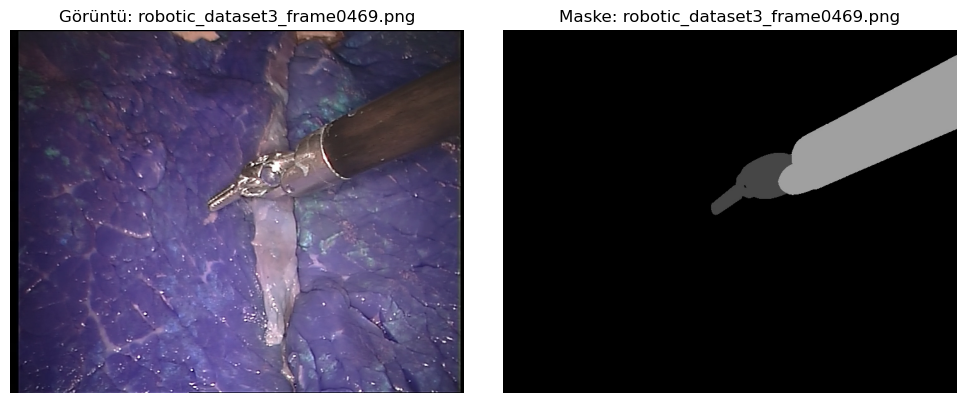

🔍 VAL setinden örnekler:


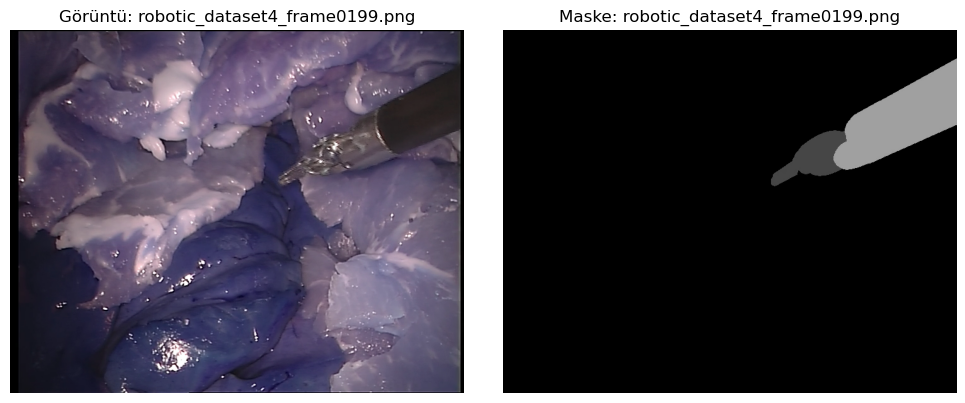

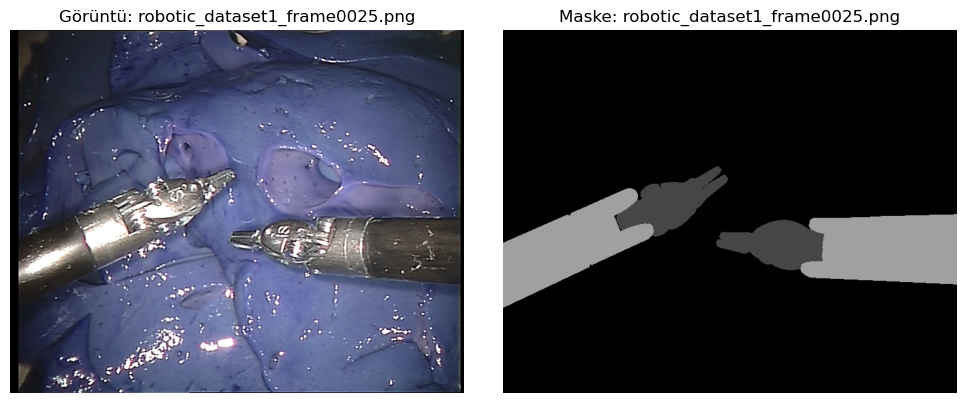

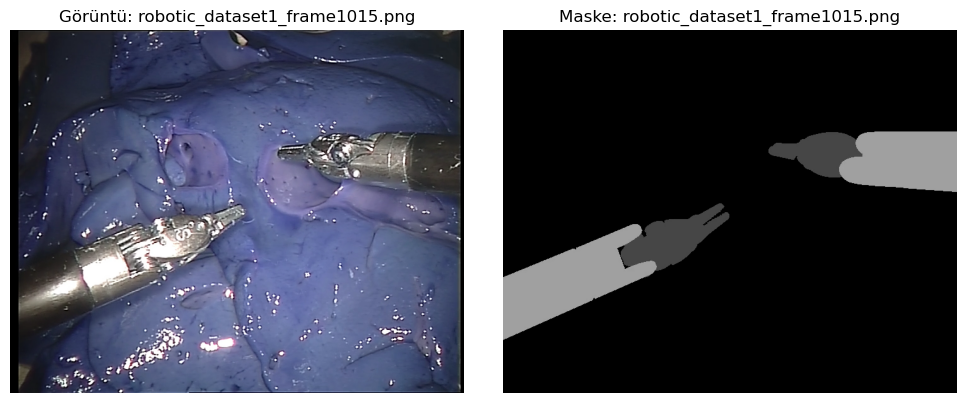

🔍 TEST setinden örnekler:


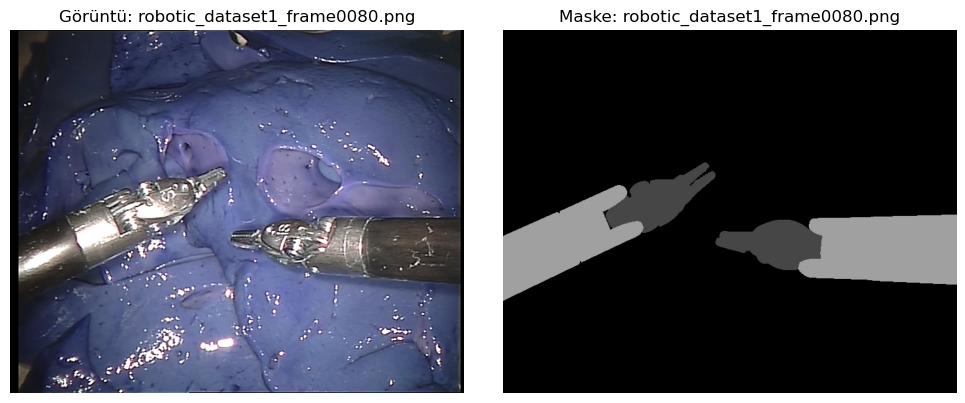

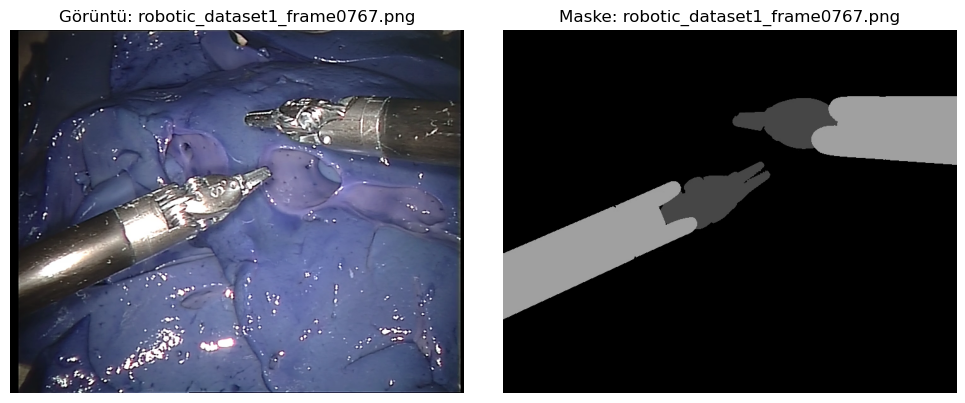

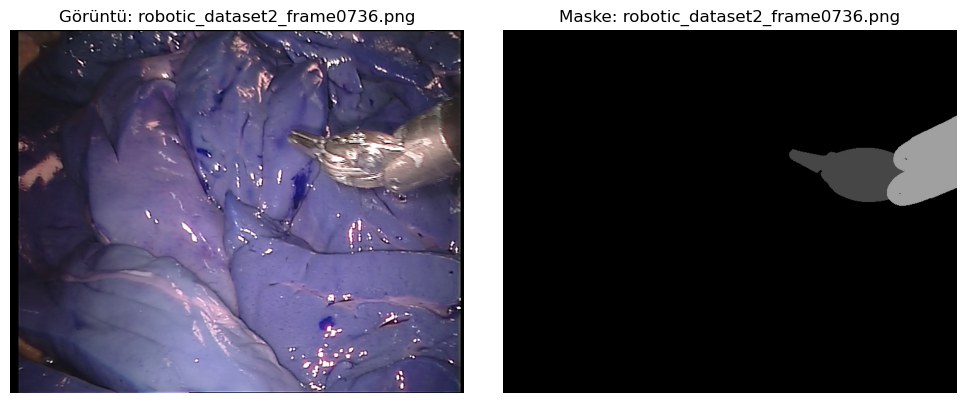

In [13]:
import random
import cv2
import matplotlib.pyplot as plt
from pathlib import Path

# 📁 Ana yol
base_path = Path(r"C:/Users/EXCALIBUR/Desktop/project/data/combined")

# 🔄 İnceleyeceğimiz split'ler
splits = ['train', 'val', 'test']

# 🔁 Her split için 3 örnek göster
for split in splits:
    print(f"🔍 {split.upper()} setinden örnekler:")

    img_dir = base_path / split / "images"
    mask_dir = base_path / split / "masks"

    image_files = sorted(list(img_dir.glob("*.png")))
    samples = random.sample(image_files, 3)

    for img_path in samples:
        mask_path = mask_dir / img_path.name

        img = cv2.imread(str(img_path))
        mask = cv2.imread(str(mask_path))

        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)

        plt.figure(figsize=(10, 4))
        plt.subplot(1, 2, 1)
        plt.imshow(img)
        plt.title(f"Görüntü: {img_path.name}")
        plt.axis("off")

        plt.subplot(1, 2, 2)
        plt.imshow(mask)
        plt.title(f"Maske: {mask_path.name}")
        plt.axis("off")

        plt.tight_layout()
        plt.show()


In [15]:
import numpy as np
from PIL import Image

def preprocess_mask(mask):
    mask_np = np.array(mask)
    binary_mask = (mask_np[:, :, 0] > 10).astype(np.float32)
    return Image.fromarray((binary_mask * 255).astype(np.uint8))


In [17]:
import os
from pathlib import Path
from torch.utils.data import Dataset
from PIL import Image

class SurgicalInstrumentDataset(Dataset):
    def __init__(self, image_dir, mask_dir, transform=None, preprocess_mask_fn=None):
        self.image_dir = Path(image_dir)
        self.mask_dir = Path(mask_dir)
        self.transform = transform
        self.preprocess_mask_fn = preprocess_mask_fn
        self.images = sorted([f for f in os.listdir(self.image_dir) if f.endswith(".png")])
        self.masks = sorted([f for f in os.listdir(self.mask_dir) if f.endswith(".png")])

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_path = self.image_dir / self.images[idx]
        mask_path = self.mask_dir / self.masks[idx]
        image = Image.open(img_path).convert("RGB")
        mask = Image.open(mask_path).convert("RGB")

        if self.preprocess_mask_fn:
            mask = self.preprocess_mask_fn(mask)

        if self.transform:
            image = self.transform(image)
            mask = self.transform(mask)

        return image, mask


In [19]:
from torchvision import transforms
from torch.utils.data import DataLoader
from pathlib import Path

# 🔄 Görsel boyutlandırma + tensöre çevirme
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor()
])

# 📁 Combined klasör yolu
base = Path(r"C:/Users/EXCALIBUR/Desktop/project/data/combined")

# 📦 Dataset'ler
train_dataset = SurgicalInstrumentDataset(
    image_dir=base / "train/images",
    mask_dir=base / "train/masks",
    transform=transform,
    preprocess_mask_fn=preprocess_mask
)

val_dataset = SurgicalInstrumentDataset(
    image_dir=base / "val/images",
    mask_dir=base / "val/masks",
    transform=transform,
    preprocess_mask_fn=preprocess_mask
)

test_dataset = SurgicalInstrumentDataset(
    image_dir=base / "test/images",
    mask_dir=base / "test/masks",
    transform=transform,
    preprocess_mask_fn=preprocess_mask
)

# 🔁 DataLoader'lar
train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=4, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=4, shuffle=False)

print(f"Train: {len(train_dataset)} | Val: {len(val_dataset)} | Test: {len(test_dataset)}")


Train: 3711 | Val: 464 | Test: 464


In [29]:
import torch
import torch.nn as nn

# 🔁 Attention blok
class AttentionBlock(nn.Module):
    def __init__(self, F_g, F_l, F_int):
        super().__init__()
        self.W_g = nn.Sequential(
            nn.Conv2d(F_g, F_int, 1),
            nn.BatchNorm2d(F_int)
        )
        self.W_x = nn.Sequential(
            nn.Conv2d(F_l, F_int, 1),
            nn.BatchNorm2d(F_int)
        )
        self.psi = nn.Sequential(
            nn.Conv2d(F_int, 1, 1),
            nn.BatchNorm2d(1),
            nn.Sigmoid()
        )
        self.relu = nn.ReLU(inplace=True)

    def forward(self, g, x):
        g1 = self.W_g(g)
        x1 = self.W_x(x)
        psi = self.relu(g1 + x1)
        psi = self.psi(psi)
        return x * psi

# 🧠 Attention U-Net
class AttentionUNet(nn.Module):
    def __init__(self):
        super().__init__()

        def conv_block(in_c, out_c):
            return nn.Sequential(
                nn.Conv2d(in_c, out_c, 3, padding=1),
                nn.BatchNorm2d(out_c),
                nn.ReLU(inplace=True),
                nn.Conv2d(out_c, out_c, 3, padding=1),
                nn.BatchNorm2d(out_c),
                nn.ReLU(inplace=True)
            )

        self.pool = nn.MaxPool2d(2)

        self.enc1 = conv_block(3, 64)
        self.enc2 = conv_block(64, 128)
        self.enc3 = conv_block(128, 256)
        self.enc4 = conv_block(256, 512)
        self.bottleneck = conv_block(512, 1024)

        self.up4 = nn.ConvTranspose2d(1024, 512, 2, 2)
        self.att4 = AttentionBlock(512, 512, 256)
        self.dec4 = conv_block(1024, 512)

        self.up3 = nn.ConvTranspose2d(512, 256, 2, 2)
        self.att3 = AttentionBlock(256, 256, 128)
        self.dec3 = conv_block(512, 256)

        self.up2 = nn.ConvTranspose2d(256, 128, 2, 2)
        self.att2 = AttentionBlock(128, 128, 64)
        self.dec2 = conv_block(256, 128)

        self.up1 = nn.ConvTranspose2d(128, 64, 2, 2)
        self.att1 = AttentionBlock(64, 64, 32)
        self.dec1 = conv_block(128, 64)

        self.final = nn.Conv2d(64, 1, 1)

    def forward(self, x):
        e1 = self.enc1(x)
        e2 = self.enc2(self.pool(e1))
        e3 = self.enc3(self.pool(e2))
        e4 = self.enc4(self.pool(e3))
        b = self.bottleneck(self.pool(e4))

        d4 = self.up4(b)
        e4 = self.att4(d4, e4)
        d4 = self.dec4(torch.cat([d4, e4], dim=1))

        d3 = self.up3(d4)
        e3 = self.att3(d3, e3)
        d3 = self.dec3(torch.cat([d3, e3], dim=1))

        d2 = self.up2(d3)
        e2 = self.att2(d2, e2)
        d2 = self.dec2(torch.cat([d2, e2], dim=1))

        d1 = self.up1(d2)
        e1 = self.att1(d1, e1)
        d1 = self.dec1(torch.cat([d1, e1], dim=1))

        return torch.sigmoid(self.final(d1))


In [31]:
import torch.optim as optim
from tqdm import tqdm

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = AttentionUNet().to(device)

criterion = nn.BCELoss()
optimizer = optim.Adam(model.parameters(), lr=1e-4)

num_epochs = 20
for epoch in range(num_epochs):
    model.train()
    train_loss = 0.0

    for images, masks in tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs} - Train"):
        images, masks = images.to(device), masks.to(device)

        # 🎯 Tek kanal + normalize
        masks = masks[:, 0:1, :, :].float() / 255.0

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, masks)
        loss.backward()
        optimizer.step()
        train_loss += loss.item()

    # 🔍 Doğrulama
    model.eval()
    val_loss = 0.0
    with torch.no_grad():
        for images, masks in tqdm(val_loader, desc=f"Epoch {epoch+1}/{num_epochs} - Val"):
            images, masks = images.to(device), masks.to(device)
            masks = masks[:, 0:1, :, :].float() / 255.0
            outputs = model(images)
            loss = criterion(outputs, masks)
            val_loss += loss.item()

    print(f"📍 Epoch {epoch+1} - Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f}")


Epoch 1/20 - Val: 100%|██████████| 116/116 [00:14<00:00,  8.22it/s]


📍 Epoch 1 - Train Loss: 130.9625 | Val Loss: 6.7469


Epoch 2/20 - Val: 100%|██████████| 116/116 [00:14<00:00,  8.23it/s]


📍 Epoch 2 - Train Loss: 32.5152 | Val Loss: 2.4090


Epoch 3/20 - Val: 100%|██████████| 116/116 [00:14<00:00,  8.21it/s]


📍 Epoch 3 - Train Loss: 13.2231 | Val Loss: 1.1288


Epoch 4/20 - Val: 100%|██████████| 116/116 [00:14<00:00,  8.20it/s]


📍 Epoch 4 - Train Loss: 6.9861 | Val Loss: 0.6860


Epoch 5/20 - Val: 100%|██████████| 116/116 [00:14<00:00,  8.21it/s]


📍 Epoch 5 - Train Loss: 4.5583 | Val Loss: 0.4880


Epoch 6/20 - Val: 100%|██████████| 116/116 [00:14<00:00,  8.19it/s]


📍 Epoch 6 - Train Loss: 3.4308 | Val Loss: 0.3930


Epoch 7/20 - Val: 100%|██████████| 116/116 [00:14<00:00,  8.14it/s]


📍 Epoch 7 - Train Loss: 2.8652 | Val Loss: 0.3444


Epoch 8/20 - Val: 100%|██████████| 116/116 [00:14<00:00,  8.19it/s]


📍 Epoch 8 - Train Loss: 2.5650 | Val Loss: 0.3172


Epoch 9/20 - Val: 100%|██████████| 116/116 [00:14<00:00,  8.19it/s]


📍 Epoch 9 - Train Loss: 2.4020 | Val Loss: 0.3025


Epoch 10/20 - Val: 100%|██████████| 116/116 [00:14<00:00,  7.78it/s]


📍 Epoch 10 - Train Loss: 2.3079 | Val Loss: 0.2915


Epoch 11/20 - Val: 100%|██████████| 116/116 [00:14<00:00,  8.09it/s]


📍 Epoch 11 - Train Loss: 2.2526 | Val Loss: 0.2861


Epoch 12/20 - Val: 100%|██████████| 116/116 [00:14<00:00,  7.93it/s]


📍 Epoch 12 - Train Loss: 2.2218 | Val Loss: 0.2828


Epoch 13/20 - Val: 100%|██████████| 116/116 [00:15<00:00,  7.57it/s]


📍 Epoch 13 - Train Loss: 2.2036 | Val Loss: 0.2818


Epoch 14/20 - Val: 100%|██████████| 116/116 [00:14<00:00,  7.97it/s]


📍 Epoch 14 - Train Loss: 2.1890 | Val Loss: 0.2809


Epoch 15/20 - Val: 100%|██████████| 116/116 [00:14<00:00,  8.18it/s]


📍 Epoch 15 - Train Loss: 2.1831 | Val Loss: 0.2793


Epoch 16/20 - Val: 100%|██████████| 116/116 [00:14<00:00,  8.11it/s]


📍 Epoch 16 - Train Loss: 2.1772 | Val Loss: 0.2794


Epoch 17/20 - Val: 100%|██████████| 116/116 [00:14<00:00,  8.15it/s]


📍 Epoch 17 - Train Loss: 2.1734 | Val Loss: 0.2793


Epoch 18/20 - Val: 100%|██████████| 116/116 [00:14<00:00,  8.11it/s]


📍 Epoch 18 - Train Loss: 2.1729 | Val Loss: 0.2786


Epoch 19/20 - Val: 100%|██████████| 116/116 [00:14<00:00,  8.14it/s]


📍 Epoch 19 - Train Loss: 2.1647 | Val Loss: 0.2782


Epoch 20/20 - Val: 100%|██████████| 116/116 [00:14<00:00,  8.13it/s]

📍 Epoch 20 - Train Loss: 2.1618 | Val Loss: 0.2799


In [35]:
save_path = r"C:/Users/EXCALIBUR/Desktop/project/KOMPLEXPROJEattention_unet_model.pth"
torch.save(model.state_dict(), save_path)
print(f"✅ Model kaydedildi: {save_path}")


✅ Model kaydedildi: C:/Users/EXCALIBUR/Desktop/project/KOMPLEXPROJEattention_unet_model.pth


In [41]:
import torch

# 🎯 Cihazı belirle (önce bu olmalı)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 🔁 AttentionUNet sınıfını zaten tanımladığını varsayıyoruz
model = AttentionUNet().to(device)

# 📥 Kayıtlı ağırlıkları yükle
save_path = r"C:/Users/EXCALIBUR/Desktop/project/KOMPLEXPROJEattention_unet_model.pth"
model.load_state_dict(torch.load(save_path, map_location=device))

# 🔒 Tahmin moduna al
model.eval()

print("✅ Model başarıyla yüklendi ve eval moduna alındı.")


✅ Model başarıyla yüklendi ve eval moduna alındı.


C:\Users\EXCALIBUR\AppData\Local\Temp\ipykernel_13388\2011921473.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(save_path, map_locatio

In [61]:
from sklearn.metrics import jaccard_score, f1_score
import numpy as np

all_preds = []
all_masks = []

model.eval()
with torch.no_grad():
    for images, masks in val_loader:
        images = images.to(device)
        masks = masks[:, 0:1, :, :].to(device)  # Tek kanal
        outputs = model(images)
        
        # 🔁 Normalleştir ve binary yap (0 veya 1)
        preds = (outputs > 0.0002).float()          # ← BURASI ÖNEMLİ
        masks = (masks > 0.5).float()            # Maske de binary olmalı

        # Flatten işlemi
        all_preds.extend(preds.cpu().numpy().reshape(len(preds), -1))
        all_masks.extend(masks.cpu().numpy().reshape(len(masks), -1))

# 📊 IoU ve F1
y_true = np.vstack(all_masks)
y_pred = np.vstack(all_preds)

iou = jaccard_score(y_true, y_pred, average='samples')
f1 = f1_score(y_true, y_pred, average='samples')

print(f"IoU (Jaccard): {iou:.4f}")
print(f"F1 Score: {f1:.4f}")


IoU (Jaccard): 0.7994
F1 Score: 0.8823


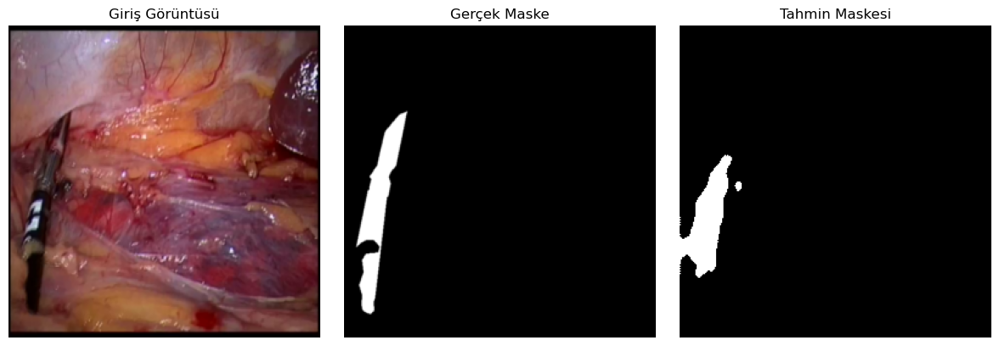

In [57]:
import matplotlib.pyplot as plt

model.eval()
with torch.no_grad():
    for images, masks in val_loader:
        images, masks = images.to(device), masks.to(device)
        masks = masks[:, 0:1, :, :].float() / 255.0
        outputs = model(images)
        preds = (outputs > 0.0002).float()
        break  # İlk batch yeterli

def plot_example(image, true_mask, pred_mask, index=0):
    image = image[index].permute(1, 2, 0).cpu().numpy()
    true_mask = true_mask[index][0].cpu().numpy()
    pred_mask = pred_mask[index][0].cpu().numpy()

    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(image)
    plt.title("Giriş Görüntüsü")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(true_mask, cmap='gray')
    plt.title("Gerçek Maske")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(pred_mask, cmap='gray')
    plt.title("Tahmin Maskesi")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

# İlk görselleştirme
plot_example(images, masks, preds)


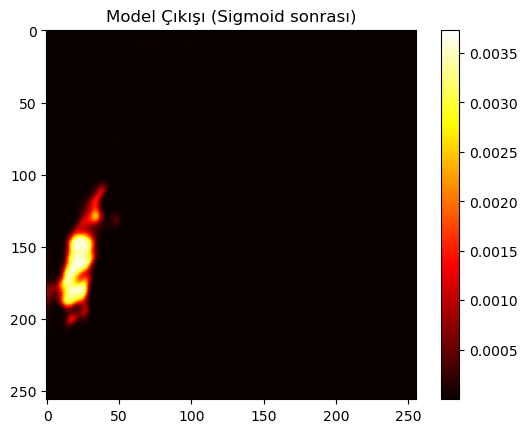

In [51]:
plt.imshow(outputs[0][0].cpu().numpy(), cmap="hot")
plt.title("Model Çıkışı (Sigmoid sonrası)")
plt.colorbar()
plt.show()


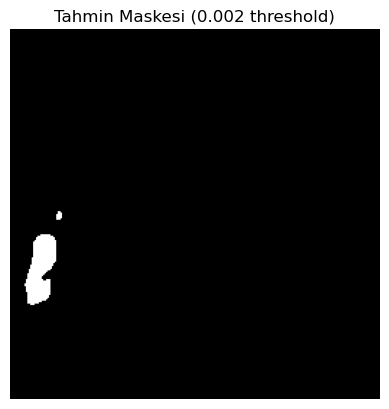

In [59]:
plt.imshow((outputs[0][0].detach().cpu().numpy() > 0.002).astype(float), cmap="gray")
plt.title("Tahmin Maskesi (0.002 threshold)")
plt.axis("off")
plt.show()


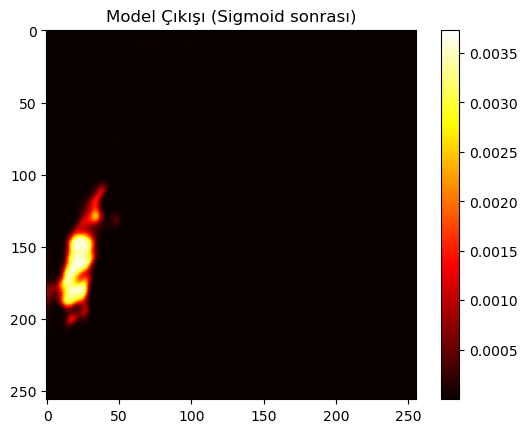

In [65]:
import matplotlib.pyplot as plt

# Örnek bir batch'ten ilk model çıkışını görselleştir
images, masks = next(iter(val_loader))
images = images.to(device)
with torch.no_grad():
    outputs = model(images)

plt.imshow(outputs[0, 0].cpu(), cmap='hot')  # İlk görüntüdeki mask çıkışı
plt.colorbar()
plt.title("Model Çıkışı (Sigmoid sonrası)")
plt.show()


In [67]:
print("Min:", outputs.min().item())
print("Max:", outputs.max().item())
print("Mean:", outputs.mean().item())


Min: 2.503171181444941e-08
Max: 0.003768148133531213
Mean: 0.0001070565267582424


In [69]:
print(masks.max(), masks.min(), masks.unique())


tensor(1.) tensor(0.) tensor([0.0000, 0.0039, 0.0078, 0.0118, 0.0157, 0.0196, 0.0235, 0.0275, 0.0314,
        0.0353, 0.0392, 0.0431, 0.0471, 0.0510, 0.0549, 0.0588, 0.0627, 0.0667,
        0.0706, 0.0745, 0.0784, 0.0824, 0.0863, 0.0902, 0.0941, 0.0980, 0.1020,
        0.1059, 0.1098, 0.1137, 0.1176, 0.1216, 0.1255, 0.1294, 0.1333, 0.1373,
        0.1412, 0.1451, 0.1490, 0.1529, 0.1569, 0.1608, 0.1647, 0.1686, 0.1725,
        0.1765, 0.1804, 0.1843, 0.1882, 0.1922, 0.1961, 0.2000, 0.2039, 0.2078,
        0.2157, 0.2196, 0.2235, 0.2275, 0.2314, 0.2353, 0.2392, 0.2431, 0.2471,
        0.2510, 0.2549, 0.2588, 0.2627, 0.2667, 0.2706, 0.2745, 0.2784, 0.2824,
        0.2863, 0.2902, 0.2980, 0.3020, 0.3059, 0.3098, 0.3137, 0.3176, 0.3216,
        0.3255, 0.3294, 0.3333, 0.3373, 0.3412, 0.3451, 0.3490, 0.3529, 0.3569,
        0.3608, 0.3647, 0.3686, 0.3725, 0.3765, 0.3804, 0.3843, 0.3882, 0.3961,
        0.4000, 0.4078, 0.4118, 0.4196, 0.4235, 0.4275, 0.4314, 0.4353, 0.4392,
        0.4431, 0.

In [71]:
print(masks.dtype)  # torch.float32 olması gerekir


torch.float32


In [73]:
# 🎯 En son encoder katmanındaki feature map'i alacağız
features = []

def forward_hook(module, input, output):
    features.append(output)

# 🔍 Örneğin enc4 (en derin katman) — istersen bottleneck de olur
hook = model.enc4.register_forward_hook(forward_hook)


In [75]:
model.eval()
with torch.no_grad():
    for images, _ in val_loader:
        image = images[0].unsqueeze(0).to(device)  # Tek görüntü
        output = model(image)                      # Çıkış alınır
        break


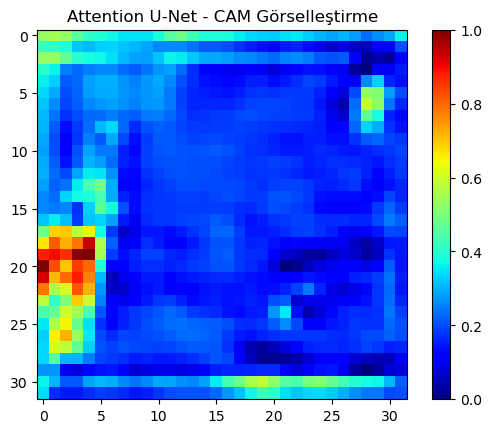

In [79]:
import matplotlib.pyplot as plt
import torch.nn.functional as F

# 🎯 İlk hooklanan özellik haritası alınır
feat_map = features[0][0]  # (C, H, W)

# 🔥 Kanal ortalaması alınır (CAM mantığı)
cam = torch.mean(feat_map, dim=0).cpu().numpy()

# 📊 Normalize et
cam = (cam - cam.min()) / (cam.max() - cam.min())

# 🎨 Görselleştir
plt.imshow(cam, cmap='jet')
plt.title("Attention U-Net - CAM Görselleştirme")
plt.colorbar()
plt.show()

# 🔧 Hook'u kaldır


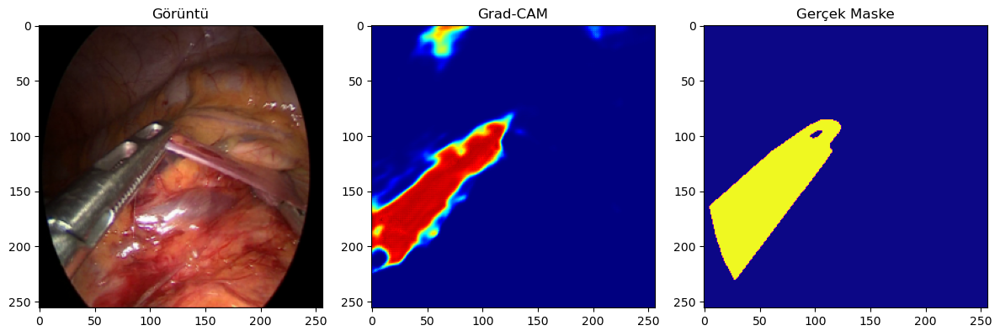

In [115]:
import matplotlib.pyplot as plt
import torchvision.transforms.functional as TF
import cv2

# 🖼 Yeni bir örnek al
val_image, val_mask = val_dataset[16]  # 🔁 örnek indeksini değiştir (0-31 arası)
input_tensor = val_image.unsqueeze(0).to(device)

# 🔍 İleri geçiş ve aktivasyonları al
model.eval()
with torch.no_grad():
    output = model(input_tensor)
    cam_map = output.squeeze().cpu().numpy()

# 🟦 Normalize et ve ısı haritası oluştur
cam_map = cv2.resize(cam_map, (256, 256))
cam_map = (cam_map - cam_map.min()) / (cam_map.max() - cam_map.min())
cam_heatmap = cv2.applyColorMap(np.uint8(255 * cam_map), cv2.COLORMAP_JET)
cam_heatmap = cv2.cvtColor(cam_heatmap, cv2.COLOR_BGR2RGB)

# 🔁 Giriş görüntüsünü yeniden boyutlandır
input_image_np = TF.resize(val_image, [256, 256]).permute(1, 2, 0).cpu().numpy()
input_image_np = (input_image_np * 255).astype(np.uint8)

# 🎯 Maske (gözlem için)
true_mask_np = TF.resize(val_mask, [256, 256]).permute(1, 2, 0).cpu().numpy()
true_mask_np = (true_mask_np > 0.5).astype(np.uint8).squeeze()

# 📊 Görselleştir
plt.figure(figsize=(12, 4))
plt.subplot(1, 3, 1)
plt.imshow(input_image_np)
plt.title("Görüntü")

plt.subplot(1, 3, 2)
plt.imshow(cam_heatmap)
plt.title("Grad-CAM")

plt.subplot(1, 3, 3)
plt.imshow(true_mask_np, cmap='plasma')
plt.title("Gerçek Maske")

plt.tight_layout()
plt.show()


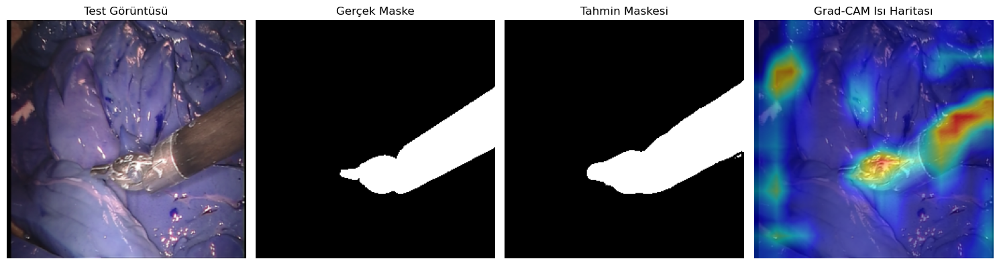

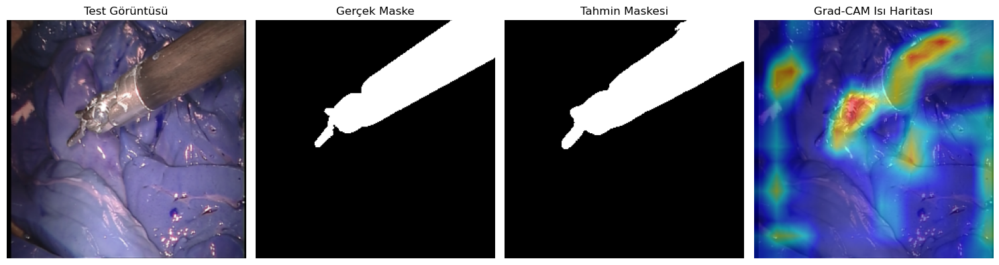

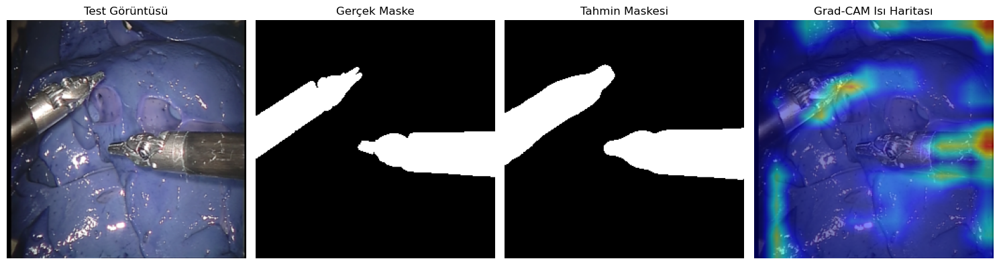

In [135]:
import torch
import torchvision.transforms.functional as TF
import matplotlib.pyplot as plt
import cv2
import numpy as np

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.eval()

activations = []
gradients = []

def forward_hook(module, input, output):
    activations.append(output)

def backward_hook(module, grad_input, grad_output):
    gradients.append(grad_output[0])

target_layer = model.bottleneck[0]
hook_f = target_layer.register_forward_hook(forward_hook)
hook_b = target_layer.register_backward_hook(backward_hook)

num_samples = 3
test_indices = torch.randperm(len(test_dataset))[:num_samples]

for idx in test_indices:
    activations.clear()
    gradients.clear()

    img, true_mask = test_dataset[idx]
    input_tensor = img.unsqueeze(0).to(device)

    output = model(input_tensor)
    pred_mask = (output > 0.0002).float().squeeze().cpu().numpy()  # Burada eşik 0.0002

    loss = output.mean()
    model.zero_grad()
    loss.backward()

    grad = gradients[0].mean(dim=(2, 3), keepdim=True)
    cam = (activations[0] * grad).sum(dim=1, keepdim=True)
    cam = torch.relu(cam)
    cam = torch.nn.functional.interpolate(cam, size=(256, 256), mode='bilinear', align_corners=False)
    cam = cam.squeeze().detach().cpu().numpy()
    cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-8)

    cam_heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)
    cam_heatmap = cv2.cvtColor(cam_heatmap, cv2.COLOR_BGR2RGB)

    img_np = TF.resize(img, [256, 256]).permute(1, 2, 0).cpu().numpy()
    img_np = (img_np * 255).astype(np.uint8)

    true_mask_np = TF.resize(true_mask, [256, 256]).permute(1, 2, 0).cpu().numpy()
    true_mask_np = (true_mask_np > 0.5).astype(np.uint8).squeeze()

    pred_mask_uint8 = (pred_mask * 255).astype(np.uint8)

    plt.figure(figsize=(15,5))

    plt.subplot(1,4,1)
    plt.imshow(img_np)
    plt.title("Test Görüntüsü")
    plt.axis('off')

    plt.subplot(1,4,2)
    plt.imshow(true_mask_np, cmap='gray')
    plt.title("Gerçek Maske")
    plt.axis('off')

    plt.subplot(1,4,3)
    plt.imshow(pred_mask_uint8, cmap='gray')
    plt.title("Tahmin Maskesi")
    plt.axis('off')

    plt.subplot(1,4,4)
    plt.imshow(img_np)
    plt.imshow(cam_heatmap, alpha=0.5)
    plt.title("Grad-CAM Isı Haritası")
    plt.axis('off')

    plt.tight_layout()
    plt.show()

hook_f.remove()
hook_b.remove()


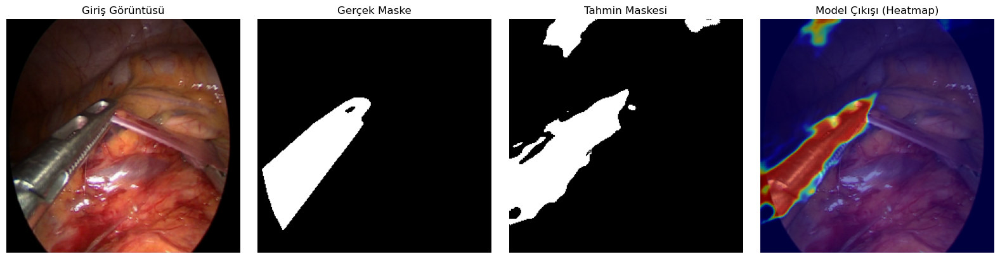

In [127]:
import matplotlib.pyplot as plt
import torchvision.transforms.functional as TF
import cv2
import numpy as np

# Yeni bir örnek al
val_image, val_mask = val_dataset[16]  # Örnek indeksini istediğin gibi değiştir
input_tensor = val_image.unsqueeze(0).to(device)

model.eval()
with torch.no_grad():
    output = model(input_tensor)
    cam_map = output.squeeze().cpu().numpy()

# Normalize et ve ısı haritası oluştur
cam_map_resized = cv2.resize(cam_map, (256, 256))
cam_map_norm = (cam_map_resized - cam_map_resized.min()) / (cam_map_resized.max() - cam_map_resized.min() + 1e-8)

cam_heatmap = cv2.applyColorMap(np.uint8(255 * cam_map_norm), cv2.COLORMAP_JET)
cam_heatmap = cv2.cvtColor(cam_heatmap, cv2.COLOR_BGR2RGB)

# Binary tahmin maskesi (eşik ile)
threshold = 0.0002  # Senin ideal eşik değerin
pred_mask = (cam_map_resized > threshold).astype(np.uint8)

# Giriş görüntüsünü yeniden boyutlandır
input_image_np = TF.resize(val_image, [256, 256]).permute(1, 2, 0).cpu().numpy()
input_image_np = (input_image_np * 255).astype(np.uint8)

# Gerçek maske (binary)
true_mask_np = TF.resize(val_mask, [256, 256]).permute(1, 2, 0).cpu().numpy()
true_mask_np = (true_mask_np > 0.5).astype(np.uint8).squeeze()

# Görselleştir
plt.figure(figsize=(16, 4))

plt.subplot(1, 4, 1)
plt.imshow(input_image_np)
plt.title("Giriş Görüntüsü")
plt.axis("off")

plt.subplot(1, 4, 2)
plt.imshow(true_mask_np, cmap='gray')
plt.title("Gerçek Maske")
plt.axis("off")

plt.subplot(1, 4, 3)
plt.imshow(pred_mask, cmap='gray')
plt.title("Tahmin Maskesi")
plt.axis("off")

plt.subplot(1, 4, 4)
plt.imshow(input_image_np)
plt.imshow(cam_heatmap, alpha=0.5)
plt.title("Model Çıkışı (Heatmap)")
plt.axis("off")

plt.tight_layout()
plt.show()


In [129]:
import os
import matplotlib.pyplot as plt
import torchvision.transforms.functional as TF
import cv2
import numpy as np

# Kayıt klasörü
save_dir = r"C:/Users/EXCALIBUR/Desktop/test_results"
os.makedirs(save_dir, exist_ok=True)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.eval()

for idx in range(len(test_dataset)):
    img, true_mask = test_dataset[idx]
    input_tensor = img.unsqueeze(0).to(device)

    with torch.no_grad():
        output = model(input_tensor)
        pred_mask = (output > 0.0002).float().squeeze().cpu().numpy()

    # Heatmap oluşturma
    cam_map = output.squeeze().cpu().numpy()
    cam_map = cv2.resize(cam_map, (256, 256))
    cam_map = (cam_map - cam_map.min()) / (cam_map.max() - cam_map.min() + 1e-8)
    cam_heatmap = cv2.applyColorMap(np.uint8(255 * cam_map), cv2.COLORMAP_JET)
    cam_heatmap = cv2.cvtColor(cam_heatmap, cv2.COLOR_BGR2RGB)

    # Görüntü, gerçek maske, tahmin maskesi numpy formatında
    img_np = TF.resize(img, [256, 256]).permute(1, 2, 0).cpu().numpy()
    img_np = (img_np * 255).astype(np.uint8)

    true_mask_np = TF.resize(true_mask, [256, 256]).permute(1, 2, 0).cpu().numpy()                      ##### TEST SONUCLARI KAYDETTU UZUN SURDU KAPATTIM ###
    true_mask_np = (true_mask_np > 0.5).astype(np.uint8).squeeze()

    pred_mask_uint8 = (pred_mask * 255).astype(np.uint8)

    # Plotlama
    plt.figure(figsize=(15,5))

    plt.subplot(1,4,1)
    plt.imshow(img_np)
    plt.title("Giriş Görüntüsü")
    plt.axis('off')

    plt.subplot(1,4,2)
    plt.imshow(true_mask_np, cmap='gray')
    plt.title("Gerçek Maske")
    plt.axis('off')

    plt.subplot(1,4,3)
    plt.imshow(pred_mask_uint8, cmap='gray')
    plt.title("Tahmin Maskesi")
    plt.axis('off')

    plt.subplot(1,4,4)
    plt.imshow(img_np)
    plt.imshow(cam_heatmap, alpha=0.5)
    plt.title("Model Çıkışı (Heatmap)")
    plt.axis('off')

    plt.tight_layout()

    # Kaydet
    save_path = os.path.join(save_dir, f"test_result_{idx}.png")
    plt.savefig(save_path)
    plt.close()

print(f"✅ Test görselleri {save_dir} klasörüne kaydedildi.")


KeyboardInterrupt: 

In [139]:
all_preds = []
all_masks = []

model.eval()
with torch.no_grad():
    for images, masks in test_loader:
        images = images.to(device)
        masks = masks[:, 0:1, :, :].to(device)  # Tek kanal maske
        outputs = model(images)

        preds = (outputs > 0.0002).float()  # Eşik değerini buradan ayarlayabilirsin

        preds_bin = preds.cpu().numpy().astype(int)
        masks_bin = masks.cpu().numpy().astype(int)

        all_preds.extend(preds_bin.reshape(len(preds), -1))
        all_masks.extend(masks_bin.reshape(len(masks), -1))

y_true = np.vstack(all_masks)
y_pred = np.vstack(all_preds)

iou = jaccard_score(y_true, y_pred, average='samples')
f1 = f1_score(y_true, y_pred, average='samples')
precision = precision_score(y_true, y_pred, average='samples')
recall = recall_score(y_true, y_pred, average='samples')

print(f"Test Seti Sonuçları:")
print(f"IoU (Jaccard): {iou:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")


C:\Users\EXCALIBUR\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Test Seti Sonuçları:
IoU (Jaccard): 0.7499
F1 Score: 0.8532
Precision: 0.7554
Recall: 0.9894


In [145]:
import numpy as np
import torch
from sklearn.metrics import jaccard_score, f1_score, precision_score, recall_score
import matplotlib.pyplot as plt

all_preds = []
all_masks = []

model.eval()
with torch.no_grad():
    for images, masks in test_loader:
        images = images.to(device)
        masks = masks[:, 0:1, :, :].to(device)
        
        outputs = model(images)
        
        # Model çıkışını threshold ile binary yap (eşik 0.0002 önerdik)
        preds = (outputs > 0.0002).float()
        masks_bin = (masks > 0.5).float()
        
        # Flatten işlemi (batch içinde her örnek ayrı ayrı)
        all_preds.extend(preds.cpu().numpy().reshape(len(preds), -1))
        all_masks.extend(masks_bin.cpu().numpy().reshape(len(masks_bin), -1))

# Numpy dizilerine çevir
y_true = np.vstack(all_masks)
y_pred = np.vstack(all_preds)

# Metrikleri hesapla
iou = jaccard_score(y_true, y_pred, average='samples')
f1 = f1_score(y_true, y_pred, average='samples')
precision = precision_score(y_true, y_pred, average='samples')
recall = recall_score(y_true, y_pred, average='samples')

# Tablo için yazdır
print(f"Test Seti Performans Metrikleri:")
print(f"IoU (Jaccard): {iou:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")


C:\Users\EXCALIBUR\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Test Seti Performans Metrikleri:
IoU (Jaccard): 0.8043
F1 Score: 0.8875
Precision: 0.8118
Recall: 0.9871


          Metric     Value
0  IoU (Jaccard)  0.804341
1       F1 Score  0.887538
2      Precision  0.811849
3         Recall  0.987065


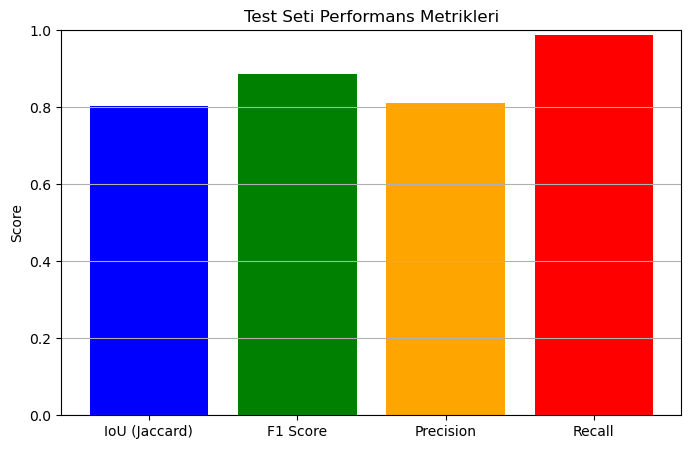

In [147]:
import pandas as pd

# Metrikleri dataframe yapısına koy
metrics = {
    "Metric": ["IoU (Jaccard)", "F1 Score", "Precision", "Recall"],
    "Value": [iou, f1, precision, recall]
}

df_metrics = pd.DataFrame(metrics)

# Tabloyu göster
print(df_metrics)

# Grafik çiz
plt.figure(figsize=(8,5))
plt.bar(df_metrics['Metric'], df_metrics['Value'], color=['blue', 'green', 'orange', 'red'])
plt.ylim(0,1)
plt.title("Test Seti Performans Metrikleri")
plt.ylabel("Score")
plt.grid(axis='y')
plt.show()
